In [2]:
import numpy as np
from cellpose import models, core, io, plot
from pathlib import Path
import matplotlib.pyplot as plt
from natsort import natsorted

io.logger_setup()

if not core.use_gpu():
    raise ImportError("ERROR: No GPU detected.")

model = models.CellposeModel(gpu=True)

zsh:1: command not found: pip
2025-12-03 19:11:42,860 [INFO] WRITING LOG OUTPUT TO /home/andrei/.cellpose/run.log
2025-12-03 19:11:42,862 [INFO] 
cellpose version: 	4.0.8.dev29+g17fb25f40 
platform:       	linux 
python version: 	3.10.17 
torch version:  	2.4.0+cu118
2025-12-03 19:11:43,087 [INFO] ** TORCH CUDA version installed and working. **
2025-12-03 19:11:43,089 [INFO] ** TORCH CUDA version installed and working. **
2025-12-03 19:11:43,090 [INFO] >>>> using GPU (CUDA)
2025-12-03 19:11:46,778 [INFO] >>>> loading model /home/andrei/.cellpose/models/cpsam


In [3]:
dir = Path("content")
image_ext = ".png"

files = natsorted([f for f in dir.glob("*"+image_ext) if "_masks" not in f.name])
print("Found", len(files), "images")

Found 6 images


In [9]:
def ensure_three_channels(img):
    if img.ndim == 2:  # grayscale
        return np.stack([img, img, img], axis=-1)
    if img.ndim == 3:
        if img.shape[-1] == 1:  # single-channel
            return np.concatenate([img, img, img], axis=-1)
        if img.shape[-1] == 3:  # RGB
            return img
        if img.shape[-1] == 4:  # RGBA
            return img[:, :, :3]
    raise ValueError("Invalid image shape: ", img.shape)

shape: (1024, 1024, 3)
2025-12-03 19:11:47,576 [INFO] processing image with (1024, 1024) HW, and 3 channels


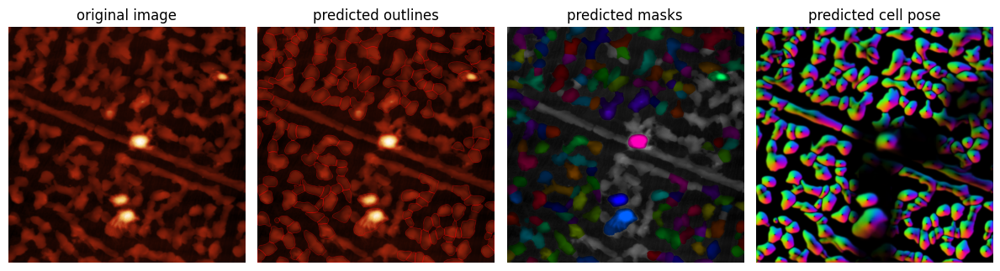

In [5]:
img = io.imread(files[0])
img = ensure_three_channels(img)

print("shape:", img.shape)

flow_threshold = 0.4
cellprob_threshold = 0.0
tile_norm_blocksize = 0

masks, flows, styles = model.eval(
    img,
    batch_size=32,
    flow_threshold=flow_threshold,
    cellprob_threshold=cellprob_threshold,
    normalize={"tile_norm_blocksize": tile_norm_blocksize}
)

fig = plt.figure(figsize=(12,5))
plot.show_segmentation(fig, img, masks, flows[0])
plt.tight_layout()
plt.show()

2025-12-03 19:11:57,991 [INFO] processing image with (1024, 1024) HW, and 3 channels


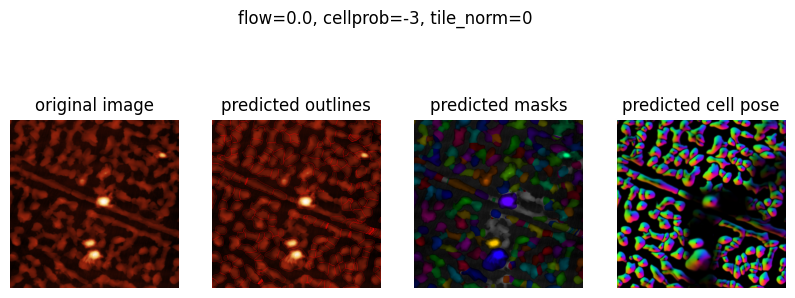

2025-12-03 19:12:05,929 [INFO] processing image with (1024, 1024) HW, and 3 channels


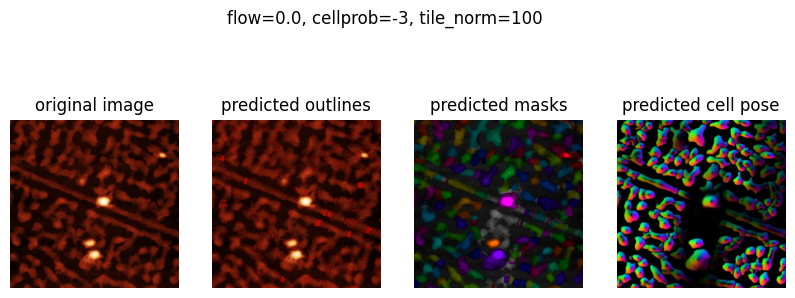

2025-12-03 19:12:14,157 [INFO] processing image with (1024, 1024) HW, and 3 channels


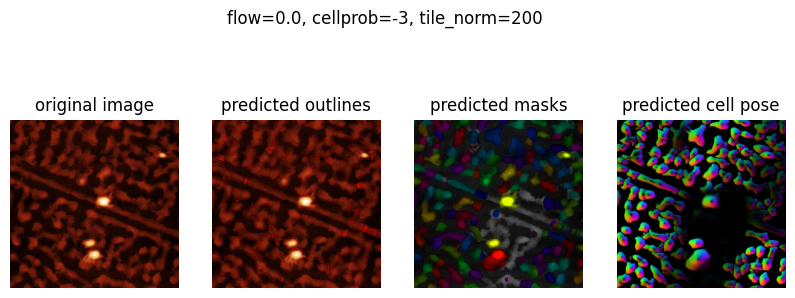

2025-12-03 19:12:22,187 [INFO] processing image with (1024, 1024) HW, and 3 channels


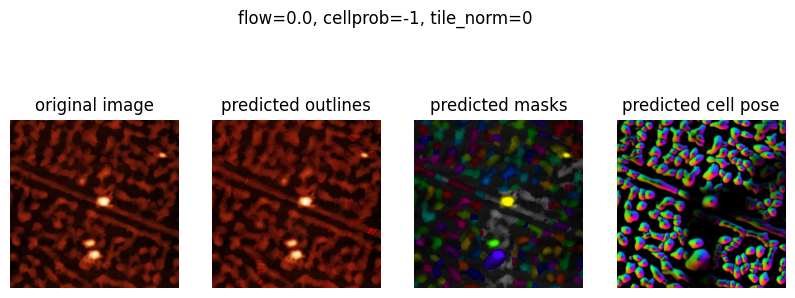

2025-12-03 19:12:30,042 [INFO] processing image with (1024, 1024) HW, and 3 channels


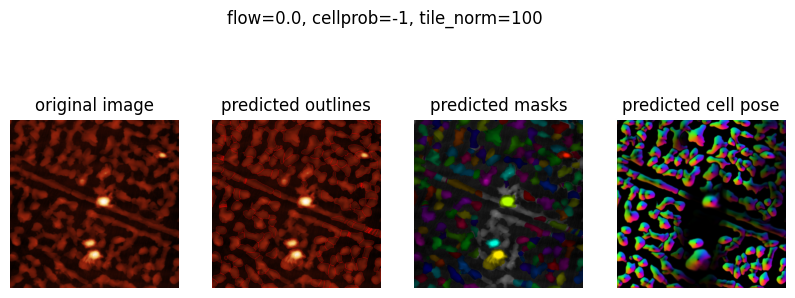

2025-12-03 19:12:37,842 [INFO] processing image with (1024, 1024) HW, and 3 channels


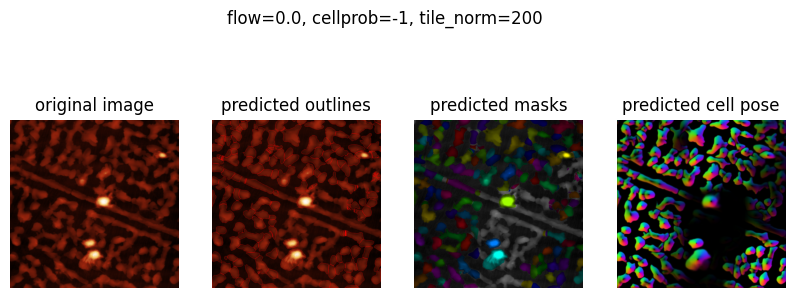

2025-12-03 19:12:45,770 [INFO] processing image with (1024, 1024) HW, and 3 channels


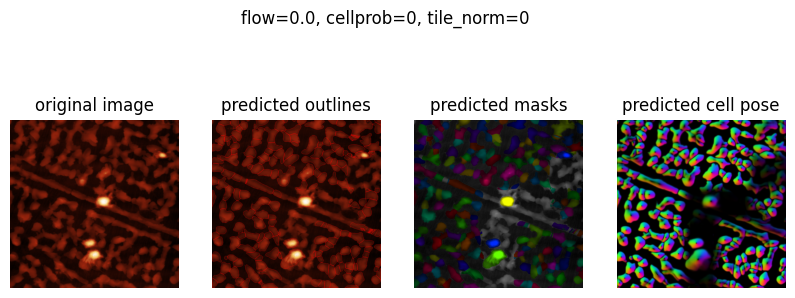

2025-12-03 19:12:53,478 [INFO] processing image with (1024, 1024) HW, and 3 channels


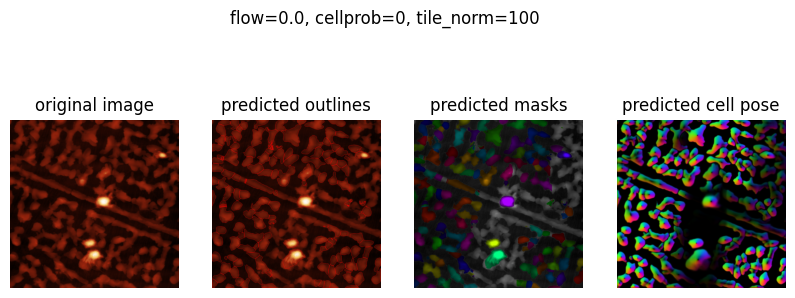

2025-12-03 19:13:01,103 [INFO] processing image with (1024, 1024) HW, and 3 channels


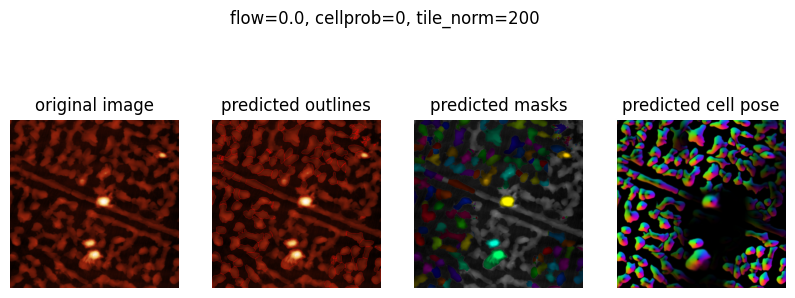

2025-12-03 19:13:08,725 [INFO] processing image with (1024, 1024) HW, and 3 channels


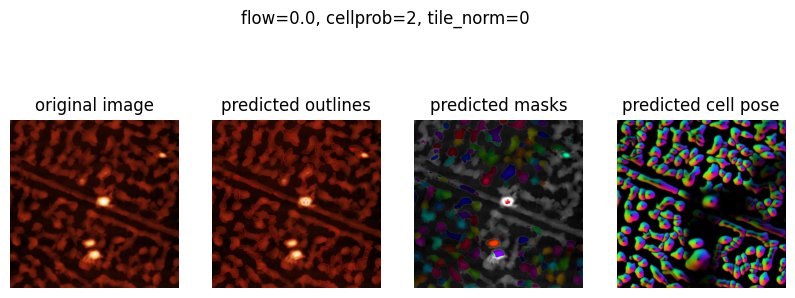

2025-12-03 19:13:16,233 [INFO] processing image with (1024, 1024) HW, and 3 channels


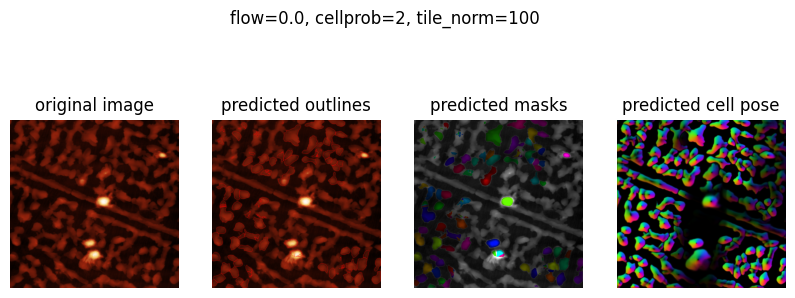

2025-12-03 19:13:23,605 [INFO] processing image with (1024, 1024) HW, and 3 channels


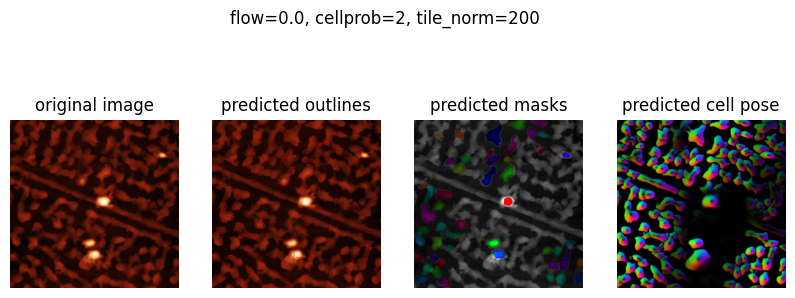

2025-12-03 19:13:30,844 [INFO] processing image with (1024, 1024) HW, and 3 channels


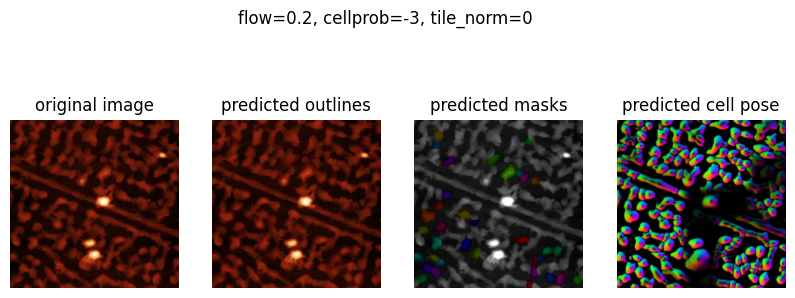

2025-12-03 19:13:39,374 [INFO] processing image with (1024, 1024) HW, and 3 channels


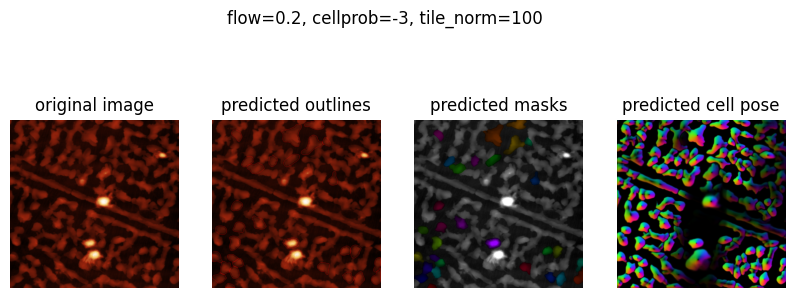

2025-12-03 19:13:47,906 [INFO] processing image with (1024, 1024) HW, and 3 channels


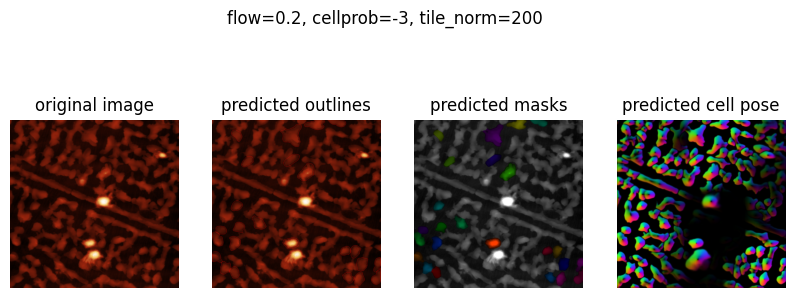

2025-12-03 19:13:56,322 [INFO] processing image with (1024, 1024) HW, and 3 channels


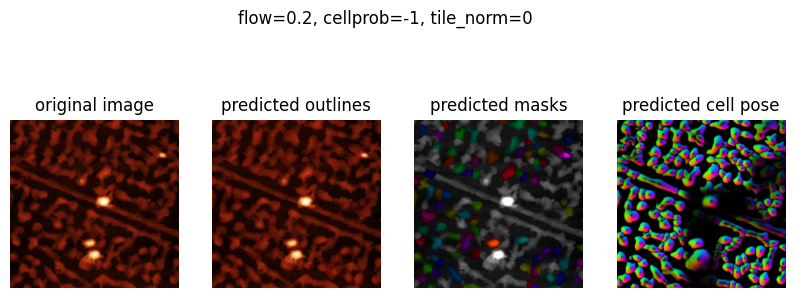

2025-12-03 19:14:04,942 [INFO] processing image with (1024, 1024) HW, and 3 channels


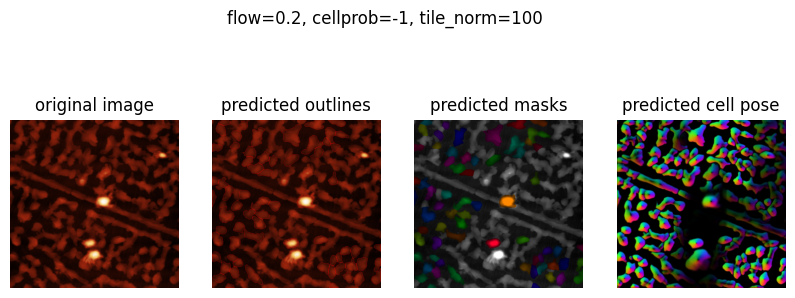

2025-12-03 19:14:13,574 [INFO] processing image with (1024, 1024) HW, and 3 channels


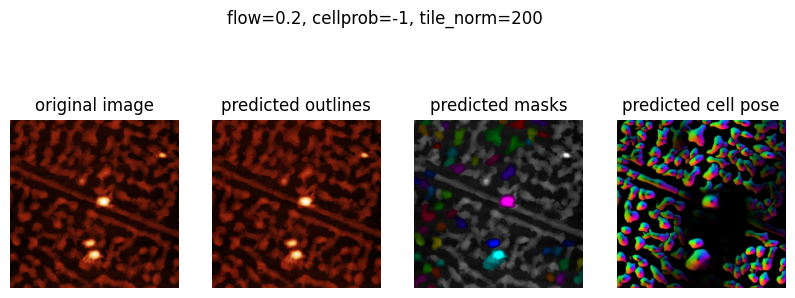

2025-12-03 19:14:21,607 [INFO] processing image with (1024, 1024) HW, and 3 channels


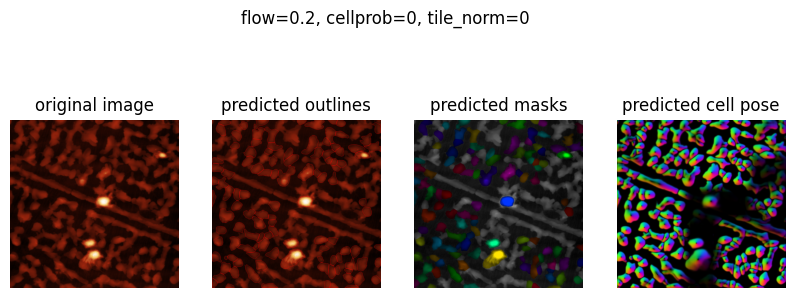

2025-12-03 19:14:29,856 [INFO] processing image with (1024, 1024) HW, and 3 channels


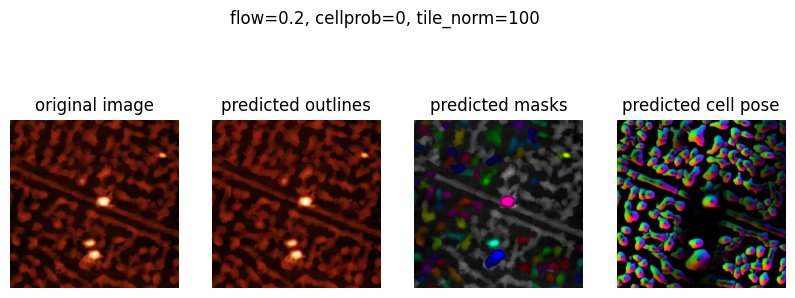

2025-12-03 19:14:38,008 [INFO] processing image with (1024, 1024) HW, and 3 channels


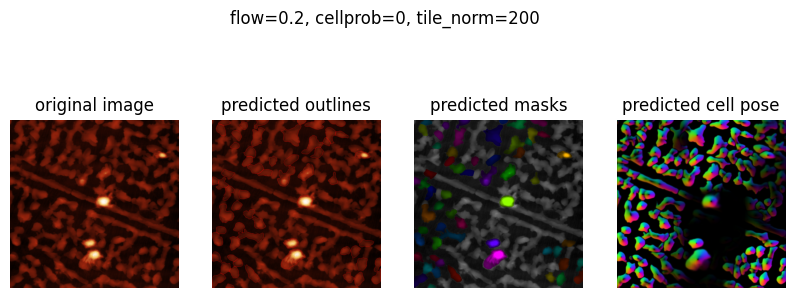

2025-12-03 19:14:45,846 [INFO] processing image with (1024, 1024) HW, and 3 channels


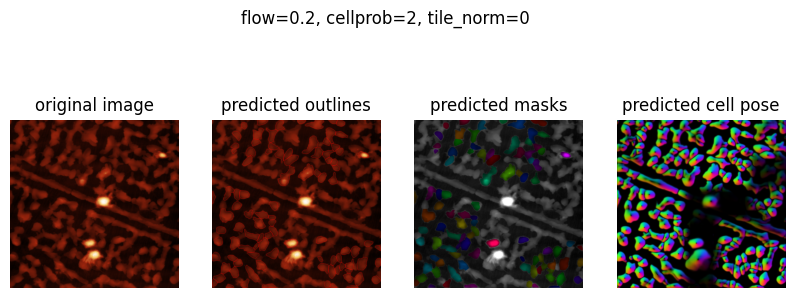

2025-12-03 19:14:53,489 [INFO] processing image with (1024, 1024) HW, and 3 channels


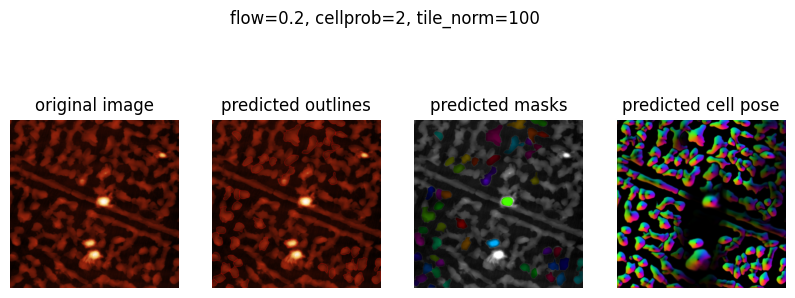

2025-12-03 19:15:00,814 [INFO] processing image with (1024, 1024) HW, and 3 channels


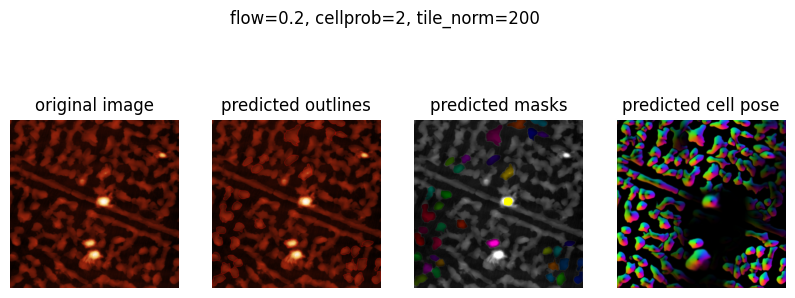

2025-12-03 19:15:08,094 [INFO] processing image with (1024, 1024) HW, and 3 channels


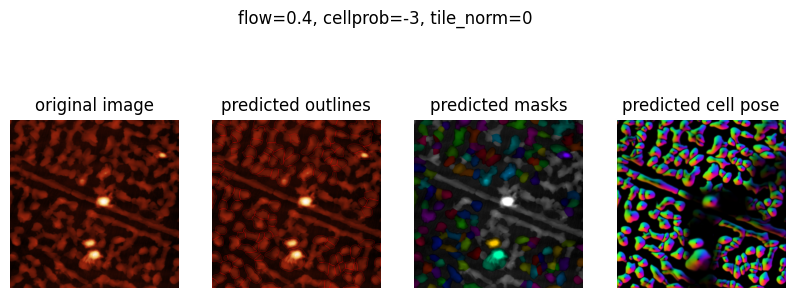

2025-12-03 19:15:17,346 [INFO] processing image with (1024, 1024) HW, and 3 channels


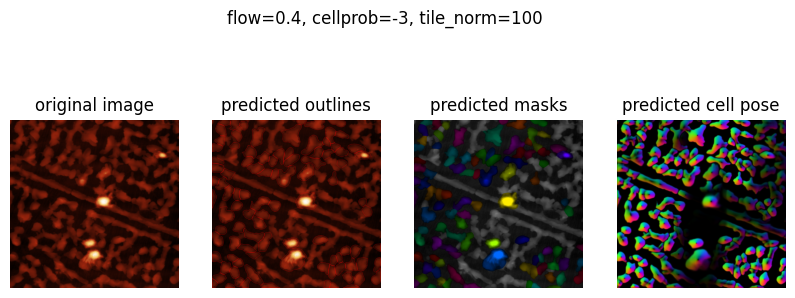

2025-12-03 19:15:26,015 [INFO] processing image with (1024, 1024) HW, and 3 channels


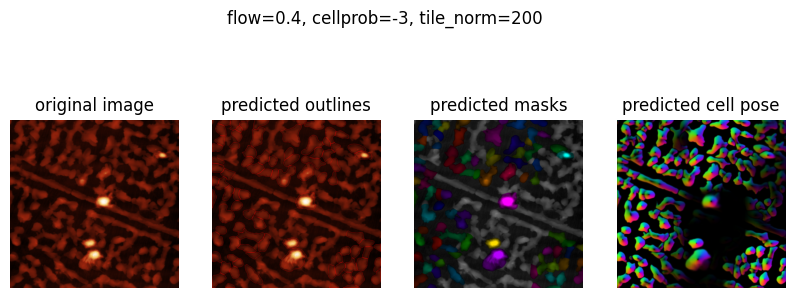

2025-12-03 19:15:34,530 [INFO] processing image with (1024, 1024) HW, and 3 channels


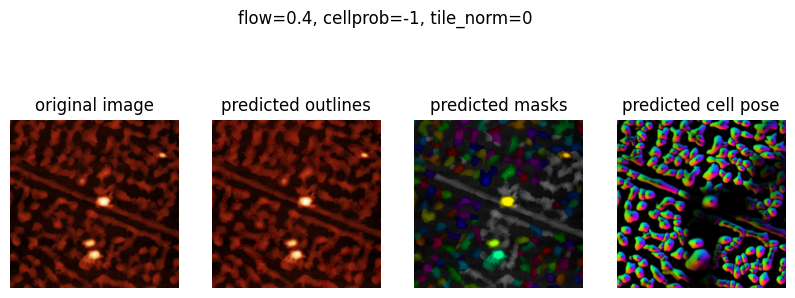

2025-12-03 19:15:43,143 [INFO] processing image with (1024, 1024) HW, and 3 channels


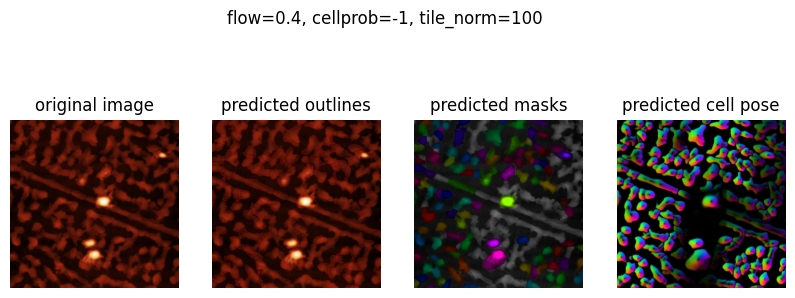

2025-12-03 19:15:51,414 [INFO] processing image with (1024, 1024) HW, and 3 channels


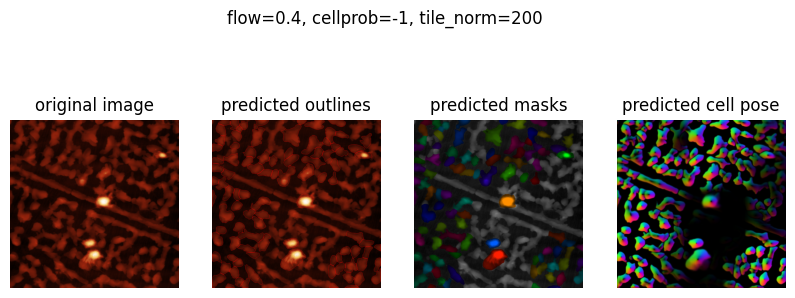

2025-12-03 19:15:59,673 [INFO] processing image with (1024, 1024) HW, and 3 channels


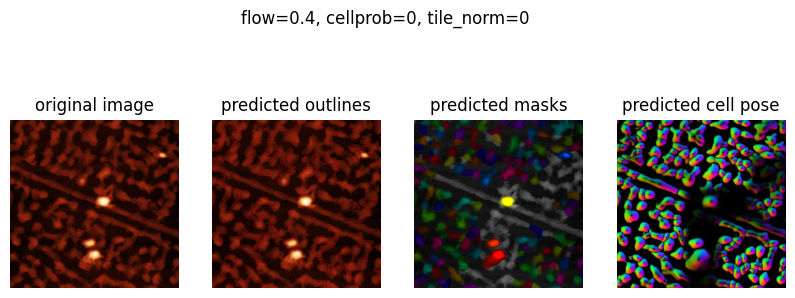

2025-12-03 19:16:08,064 [INFO] processing image with (1024, 1024) HW, and 3 channels


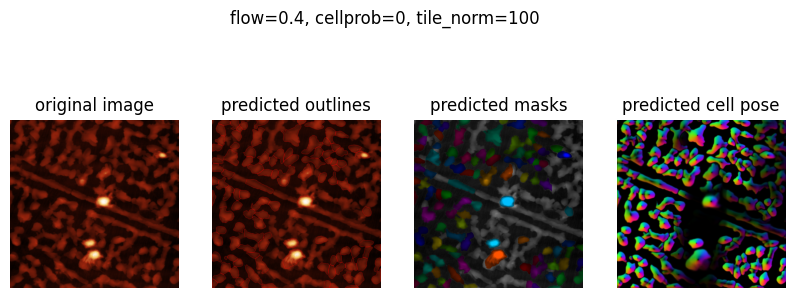

2025-12-03 19:16:16,125 [INFO] processing image with (1024, 1024) HW, and 3 channels


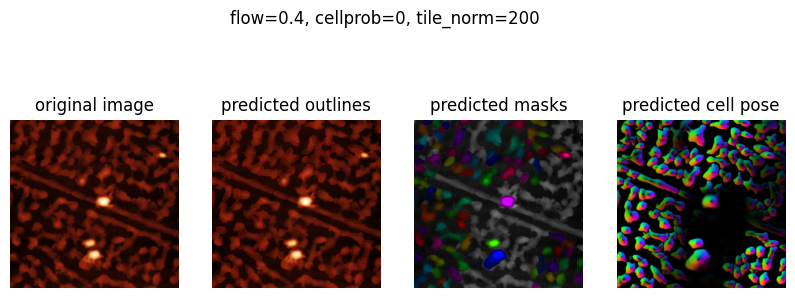

2025-12-03 19:16:24,167 [INFO] processing image with (1024, 1024) HW, and 3 channels


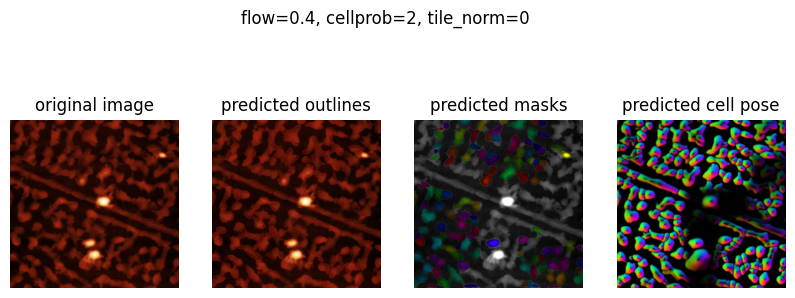

2025-12-03 19:16:31,968 [INFO] processing image with (1024, 1024) HW, and 3 channels


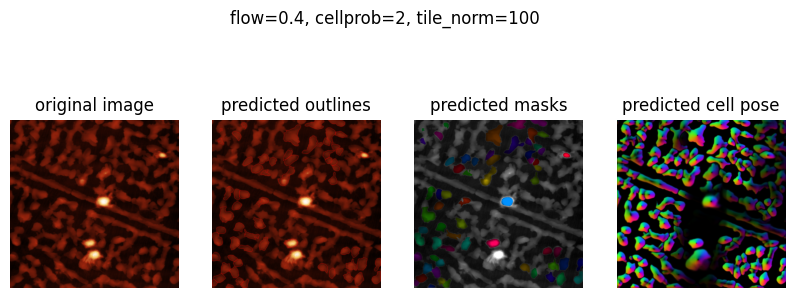

2025-12-03 19:16:39,584 [INFO] processing image with (1024, 1024) HW, and 3 channels


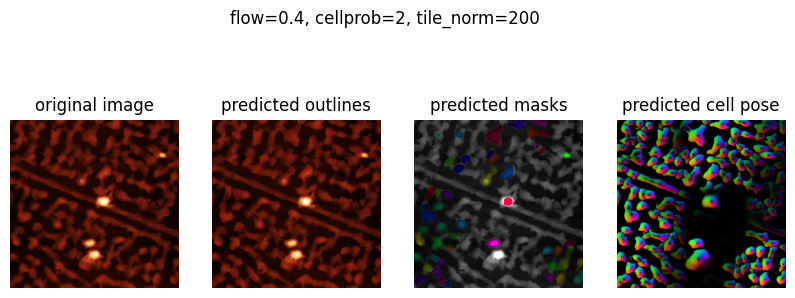

2025-12-03 19:16:47,252 [INFO] processing image with (1024, 1024) HW, and 3 channels


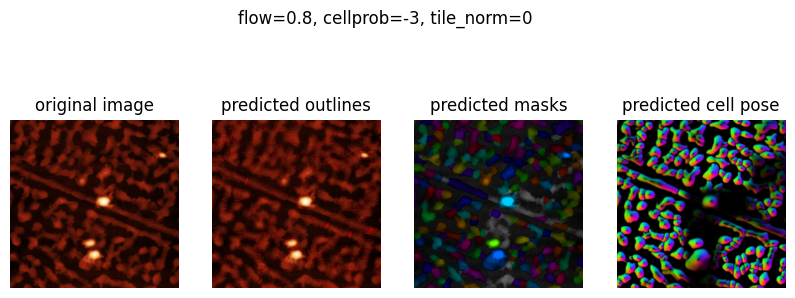

2025-12-03 19:16:56,516 [INFO] processing image with (1024, 1024) HW, and 3 channels


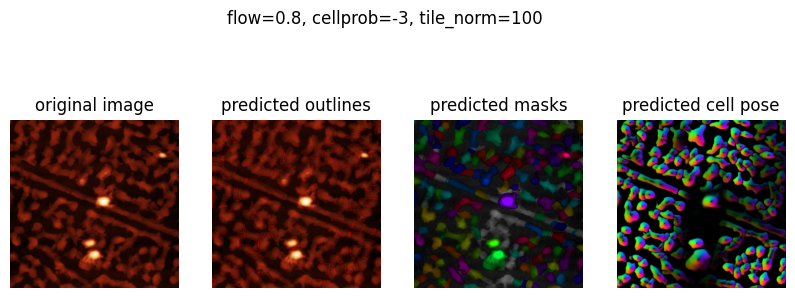

2025-12-03 19:17:05,986 [INFO] processing image with (1024, 1024) HW, and 3 channels


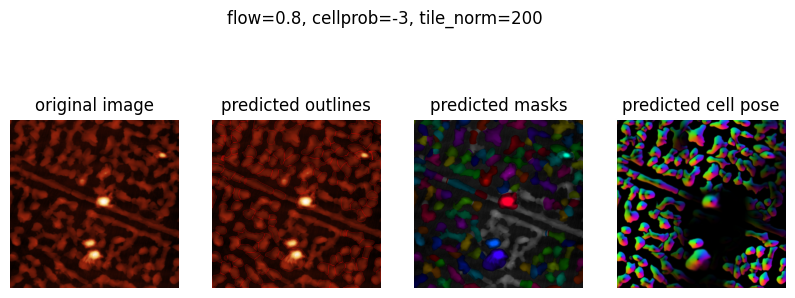

2025-12-03 19:17:14,938 [INFO] processing image with (1024, 1024) HW, and 3 channels


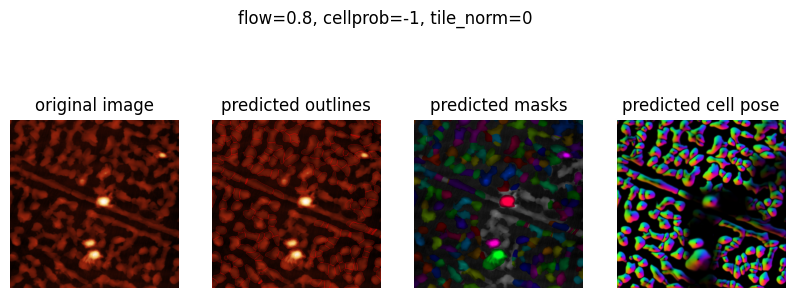

2025-12-03 19:17:23,756 [INFO] processing image with (1024, 1024) HW, and 3 channels


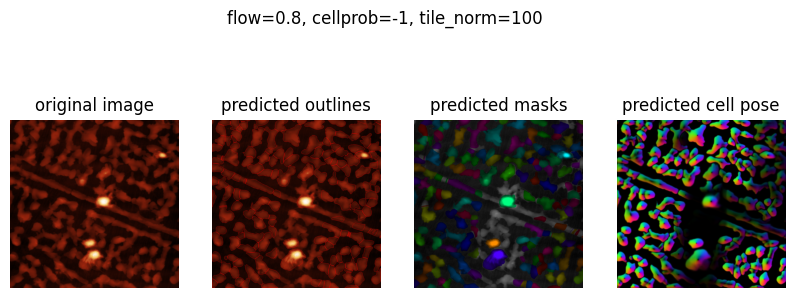

2025-12-03 19:17:32,355 [INFO] processing image with (1024, 1024) HW, and 3 channels


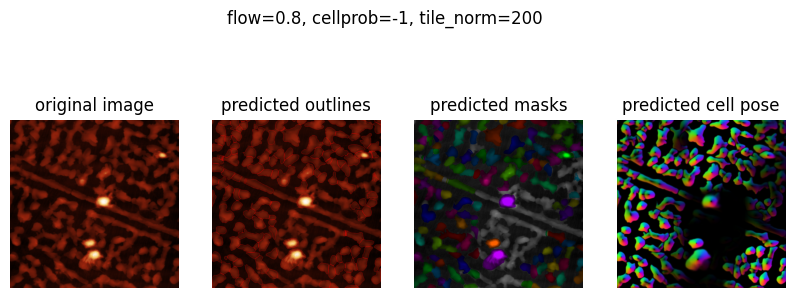

2025-12-03 19:17:40,886 [INFO] processing image with (1024, 1024) HW, and 3 channels


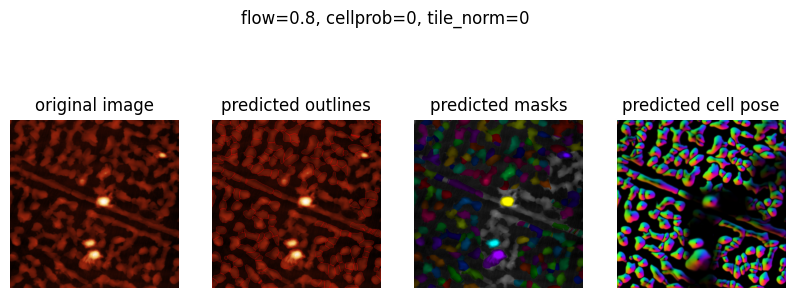

2025-12-03 19:17:49,540 [INFO] processing image with (1024, 1024) HW, and 3 channels


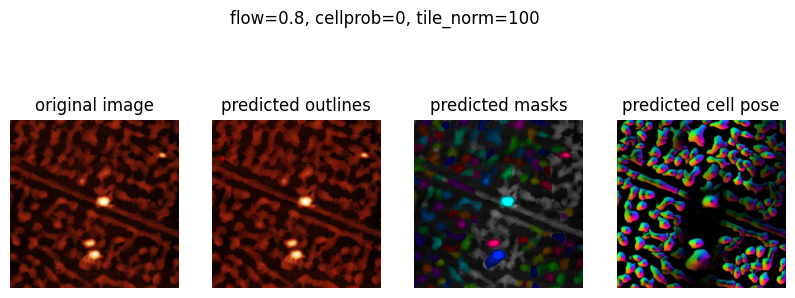

2025-12-03 19:17:57,906 [INFO] processing image with (1024, 1024) HW, and 3 channels


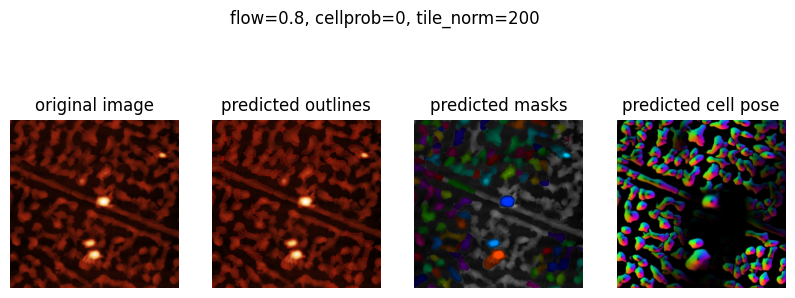

2025-12-03 19:18:05,958 [INFO] processing image with (1024, 1024) HW, and 3 channels


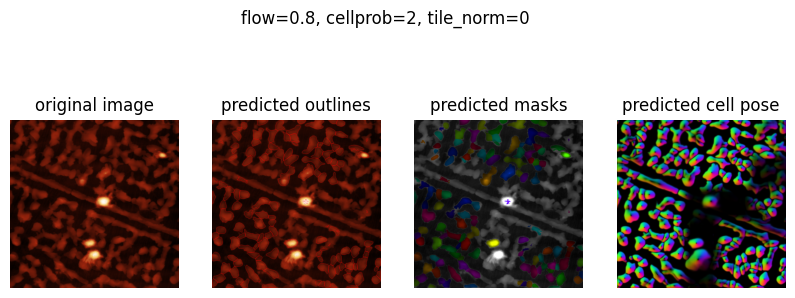

2025-12-03 19:18:13,744 [INFO] processing image with (1024, 1024) HW, and 3 channels


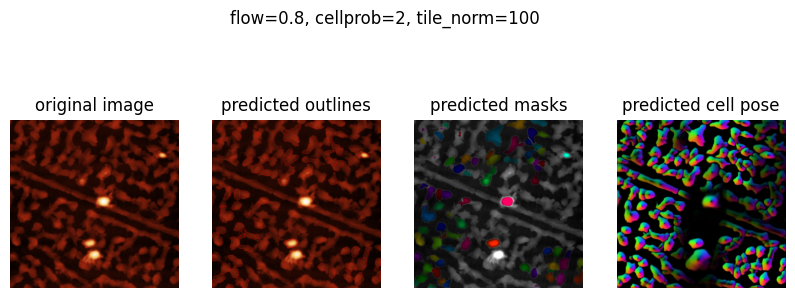

2025-12-03 19:18:21,185 [INFO] processing image with (1024, 1024) HW, and 3 channels


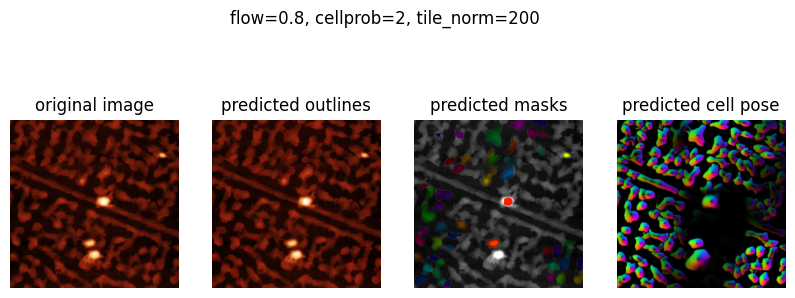

In [6]:
flow_values = [0.0, 0.2, 0.4, 0.8]
cellprob_values = [-3, -1, 0, 2]
tile_values = [0, 100, 200]

img = ensure_three_channels(io.imread(files[0]))

results = []

for flow in flow_values:
    for cp in cellprob_values:
        for tile in tile_values:

            masks, flows, styles = model.eval(
                img,
                batch_size=32,
                flow_threshold=flow,
                cellprob_threshold=cp,
                normalize={"tile_norm_blocksize": tile}
            )

            results.append((flow, cp, tile, masks))

            fig = plt.figure(figsize=(10,4))
            plt.suptitle(f"flow={flow}, cellprob={cp}, tile_norm={tile}")
            plot.show_segmentation(fig, img, masks, flows[0])
            plt.show()

2025-12-03 19:31:24,424 [INFO] processing image with (1024, 1024) HW, and 3 channels


/home/andrei/dev/cellpose/.venv/lib/python3.10/site-packages/skimage/_shared/utils.py:328: UserWarning: /home/andrei/dev/cellpose/content/153_3_masks16.tif is a low contrast image
  return func(*args, **kwargs)


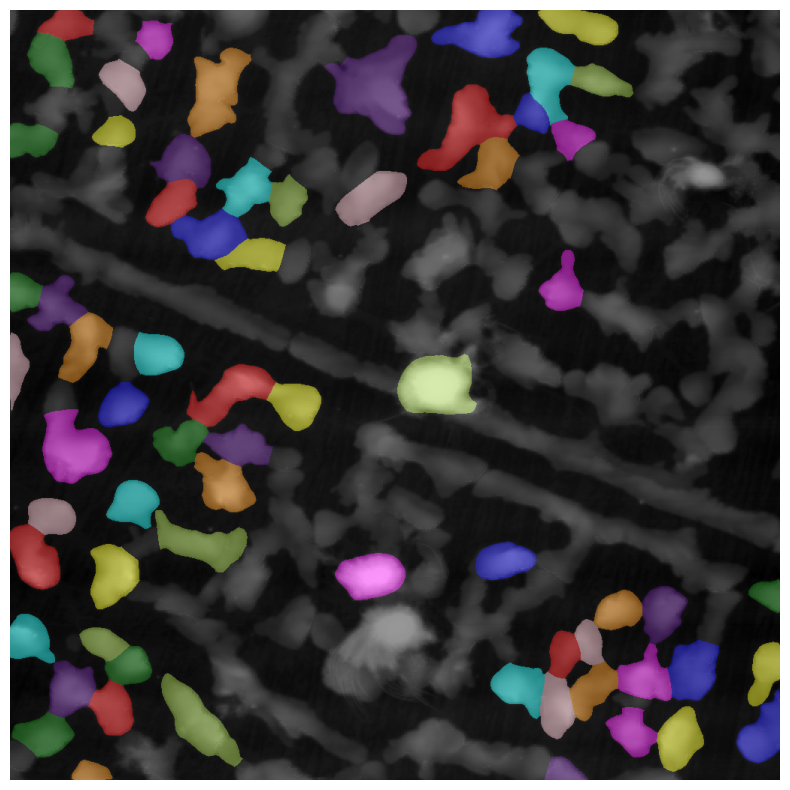

2025-12-03 19:31:32,754 [INFO] processing image with (1024, 1024) HW, and 3 channels


/home/andrei/dev/cellpose/.venv/lib/python3.10/site-packages/skimage/_shared/utils.py:328: UserWarning: /home/andrei/dev/cellpose/content/154_1_masks16.tif is a low contrast image
  return func(*args, **kwargs)


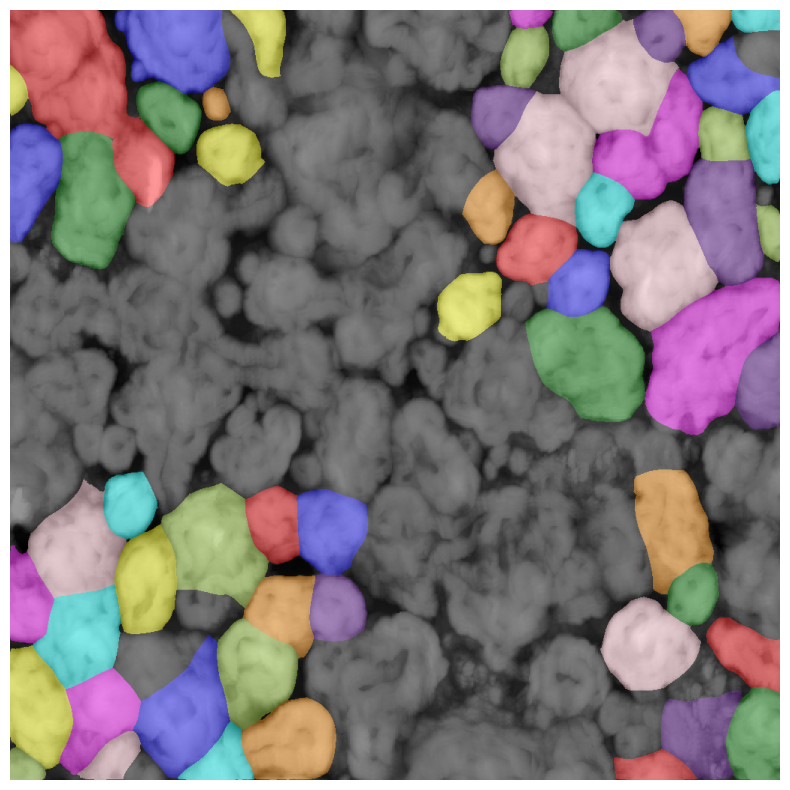

2025-12-03 19:31:42,557 [INFO] processing image with (1024, 1024) HW, and 3 channels


/home/andrei/dev/cellpose/.venv/lib/python3.10/site-packages/skimage/_shared/utils.py:328: UserWarning: /home/andrei/dev/cellpose/content/157_3_masks16.tif is a low contrast image
  return func(*args, **kwargs)


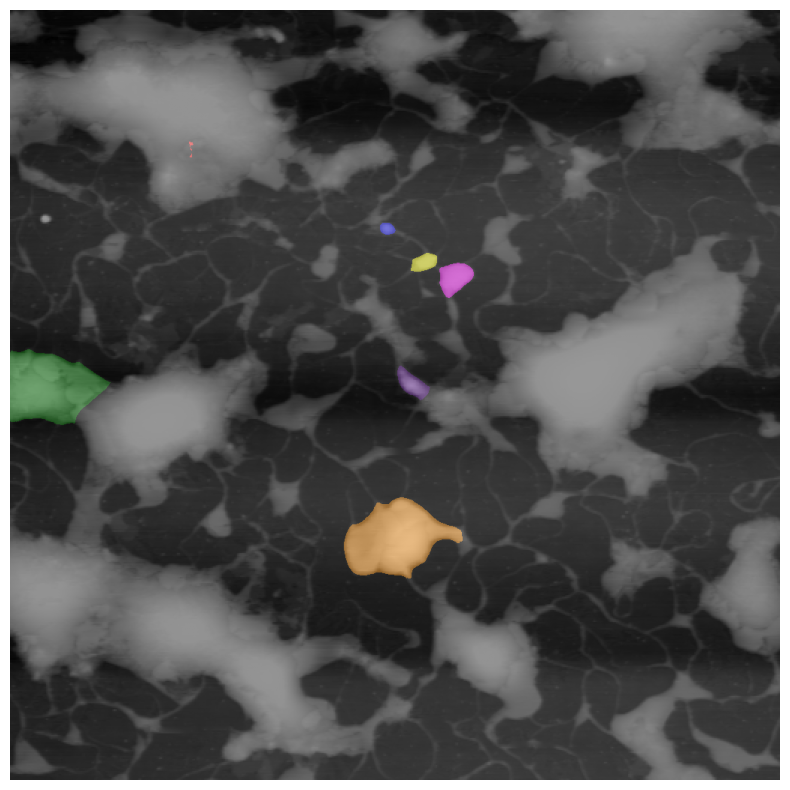

2025-12-03 19:31:50,264 [INFO] processing image with (1024, 1024) HW, and 3 channels


/home/andrei/dev/cellpose/.venv/lib/python3.10/site-packages/skimage/_shared/utils.py:328: UserWarning: /home/andrei/dev/cellpose/content/160_4_masks16.tif is a low contrast image
  return func(*args, **kwargs)


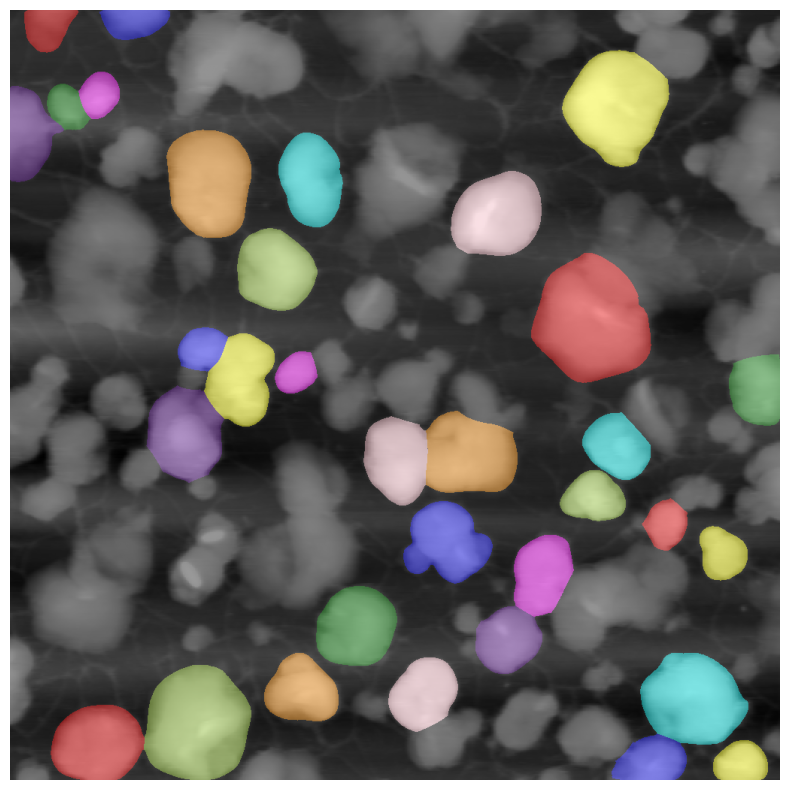

2025-12-03 19:31:58,475 [INFO] processing image with (1024, 1024) HW, and 3 channels


/home/andrei/dev/cellpose/.venv/lib/python3.10/site-packages/skimage/_shared/utils.py:328: UserWarning: /home/andrei/dev/cellpose/content/170_1_masks16.tif is a low contrast image
  return func(*args, **kwargs)


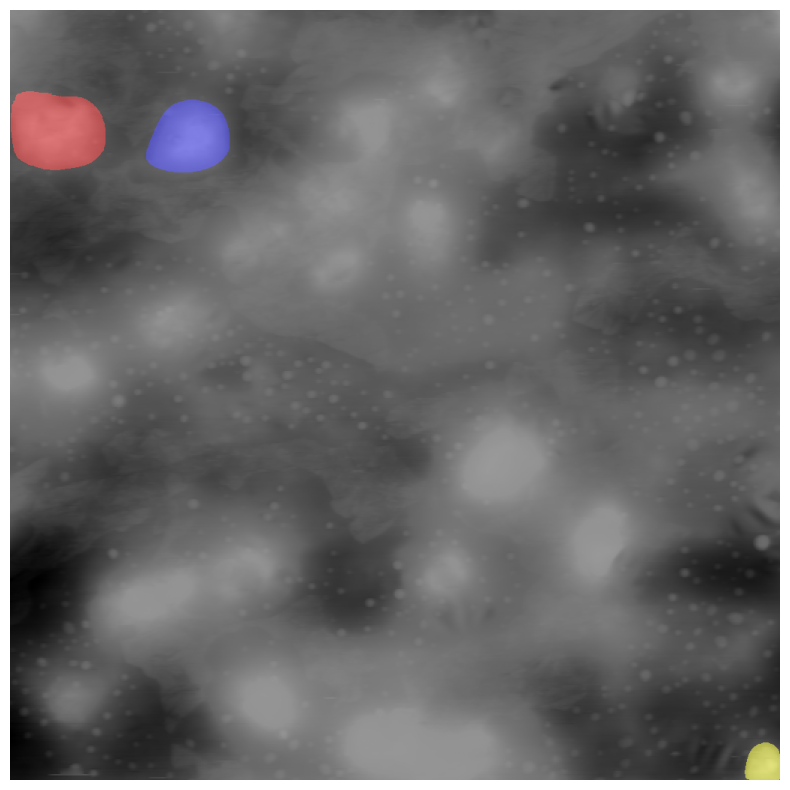

2025-12-03 19:32:06,180 [INFO] processing image with (1024, 1024) HW, and 3 channels


/home/andrei/dev/cellpose/.venv/lib/python3.10/site-packages/skimage/_shared/utils.py:328: UserWarning: /home/andrei/dev/cellpose/content/170_6_masks16.tif is a low contrast image
  return func(*args, **kwargs)


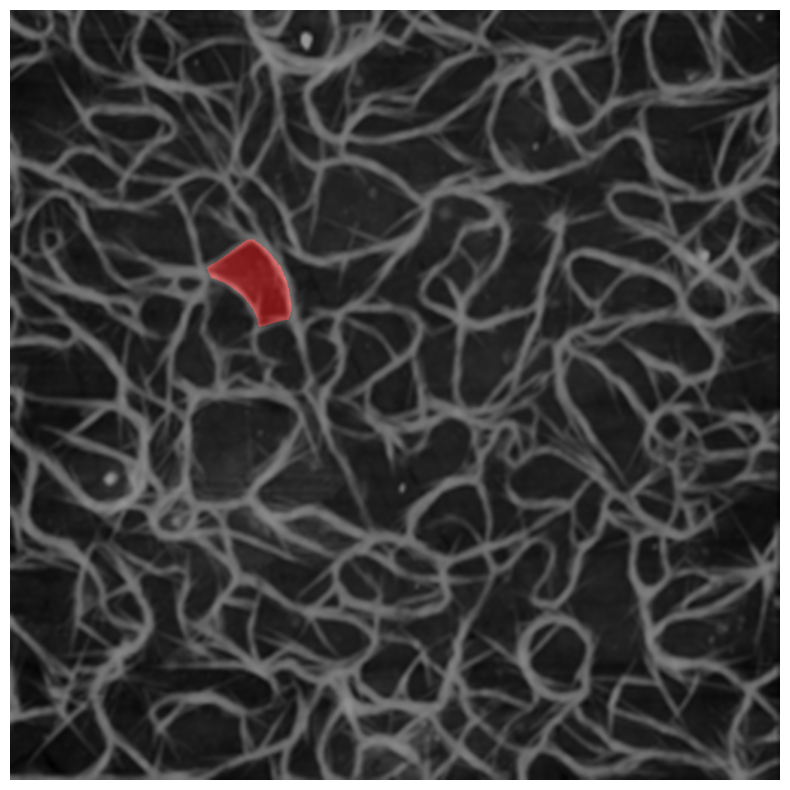

In [10]:
flow_threshold = 0.2
cellprob_threshold = -1
tile_norm_blocksize = 100

from skimage import io
from skimage.color import label2rgb

for f in files:
    img = ensure_three_channels(io.imread(f))

    masks, flows, styles = model.eval(
        img,
        batch_size=32,
        flow_threshold=flow_threshold,
        cellprob_threshold=cellprob_threshold,
        normalize={"tile_norm_blocksize": tile_norm_blocksize}
    )
    
    overlay = label2rgb(masks, image=img, alpha=0.4)
    
    plt.figure(figsize=(10,10))
    plt.imshow(overlay)
    plt.axis('off')
    plt.savefig(f.parent / (f.stem + "_overlay.png"))
    plt.show()